# Prompt Generator for Stable Diffusion

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```python
%pip install -U --pre ekorpkit[art]

exit()
```

## Preparing the environment


In [1]:
%config InlineBackend.figure_format='retina'
%load_ext autotime

from ekorpkit import eKonf

eKonf.setLogger("WARNING")
print("version:", eKonf.__version__)

is_colab = eKonf.is_colab()
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive()
workspace_dir = "/content/drive/MyDrive/workspace"
project_name = "ekorpkit-book"
pc = eKonf.set_workspace(workspace=workspace_dir, project=project_name)
print("project_dir:", pc.project_dir)
pc.envs.dict()

INFO:ekorpkit.base:Set environment variable EKORPKIT_WORKSPACE_ROOT=/content/drive/MyDrive/workspace
INFO:ekorpkit.base:Set environment variable EKORPKIT_PROJECT_DIR=/content/drive/MyDrive/workspace/projects/ekorpkit-book


version: 0.1.40.post0.dev46
is colab? False


INFO:ekorpkit.base:There are no arguments to initilize a config, using default config.


project_dir: /content/drive/MyDrive/workspace/projects/ekorpkit-book


{'EKORPKIT_CONFIG_DIR': '/workspace/projects/ekorpkit-book/config',
 'EKORPKIT_WORKSPACE_ROOT': '/content/drive/MyDrive/workspace',
 'EKORPKIT_PROJECT': 'ekorpkit-book',
 'EKORPKIT_PROJECT_DIR': '/content/drive/MyDrive/workspace/projects/ekorpkit-book',
 'EKORPKIT_DATA_DIR': None,
 'EKORPKIT_LOG_LEVEL': 'WARNING',
 'NUM_WORKERS': 230,
 'KMP_DUPLICATE_LIB_OK': 'TRUE',
 'CUDA_DEVICE_ORDER': None,
 'CUDA_VISIBLE_DEVICES': None,
 'WANDB_PROJECT': None,
 'WANDB_DISABLED': None}

time: 1.5 s (started: 2022-12-06 04:33:24 +00:00)


## Load a Generator and Generate Prompts

To download a certain dataset or model checkpoint, you may need to provide a HuggingFace API token. You can get one from [here](https://huggingface.co/settings/token).

```python
# Set HuggingFace API token
pc.secrets.HUGGING_FACE_HUB_TOKEN = "YOUR_TOKEN"
```

In [2]:
# Set HuggingFace API token
# pc.secrets.HUGGING_FACE_HUB_TOKEN = "YOUR_TOKEN"

pc.secrets.dict()

{'WANDB_API_KEY': SecretStr('**********'),
 'HUGGING_FACE_HUB_TOKEN': None,
 'ECOS_API_KEY': SecretStr('**********'),
 'FRED_API_KEY': SecretStr('**********'),
 'NASDAQ_API_KEY': SecretStr('**********'),
 'HF_USER_ACCESS_TOKEN': SecretStr('**********')}

time: 2.02 ms (started: 2022-12-06 04:33:25 +00:00)


In [3]:
# Set CUDA DEVICES for the model

pc.envs.CUDA_VISIBLE_DEVICES = "1,2"

INFO:ekorpkit.base:Set environment variable CUDA_VISIBLE_DEVICES=1,2


time: 954 µs (started: 2022-12-06 04:33:25 +00:00)


In [4]:
from ekorpkit.tasks.nlp import PromptGenerator

pgen = PromptGenerator()

2022-12-06 04:33:25.971723: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
INFO:ekorpkit.base:Set environment variable HUGGING_FACE_HUB_TOKEN=**********
INFO:ekorpkit.base:No method defined to call


time: 9.97 s (started: 2022-12-06 04:33:25 +00:00)


### Loading a model

Before loading a model, you need to train a model first. To train a model, refer to the [Training a Generator](#training-a-generator) section.

In [5]:

# pgen.load_model(model_name="ekorpkit/stable-prompts")

pgen.load_model(model_name="ekorpkit/prompt_parrot")


time: 1.65 s (started: 2022-12-06 04:33:35 +00:00)


### Generating prompts

You can generate prompts using the `generate_prompts` function. The function takes the following arguments:

- `prompt`: The prompt to be used for generating prompts. If `None`, the prompt will be generated automatically.
- `num_prompts_to_generate`: The number of prompts to be generated.
- `generate_images`: Whether to generate images for the prompts.
- `num_samples`: The number of images to be generated for each prompt.
- For other arguments, refer to the following code.


In [6]:
pgen._generate_.dict()

{'prompt': None,
 'num_prompts_to_generate': 5,
 'max_prompt_length': 50,
 'min_prompt_length': 30,
 'temperature': 1.2,
 'top_k': 70,
 'top_p': 0.9}

time: 3.19 ms (started: 2022-12-06 04:33:37 +00:00)


Prompt[0]: With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds, digital painting, trending on artstation, moody palette, high contrast, contrasting, contrasting, contrasting, contrasting, contrasting, contrasting, contrasting, contrasting


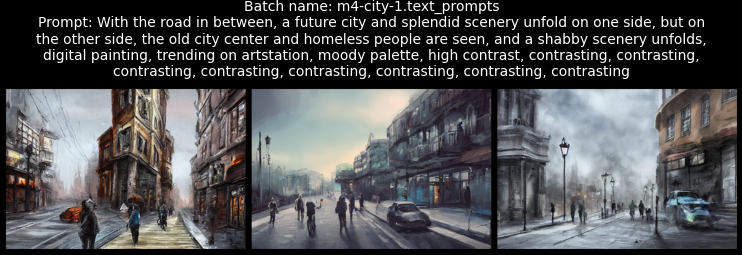

Prompt[1]: With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds in the afternoon, moody palette, artstation, character concept, oil on canvas, concept design, vibrant, hdr, 4 k, trending on


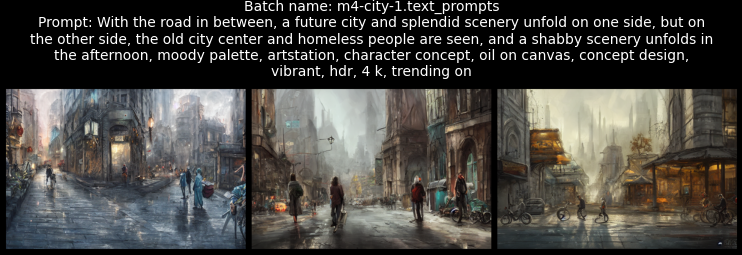

Prompt[2]: With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds, by Caspar David Friedrich, dystopian novelists, oil on canvas, artstation, digital painting, dramatic scenery, cinematic lighting, contest winner, highly


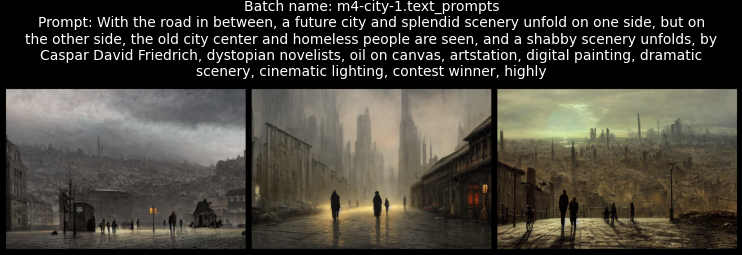

Prompt[3]: With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds, deviantart, by Jordan Grimmer and RHADS and Gilbert Williams and albert bierstadt, moody palette, dark scene, digital painting


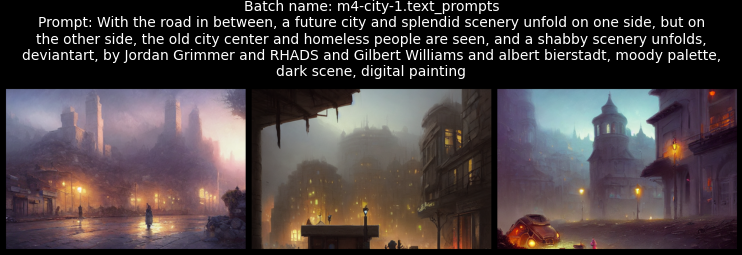

Prompt[4]: With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds on the other side, dramatic scenery, low hanging wallpaper, artstation, deviantart, vibrant, deviantart, vibrant, illustration, magical realism


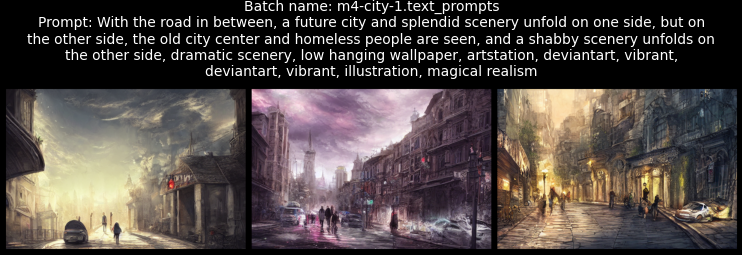

Prompt[5]: With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds on the other side, by Richard Bacon and Beeple, vibrant, fantasy, cityscape, by Peter Mohrbacher, masterpiece, soft render,


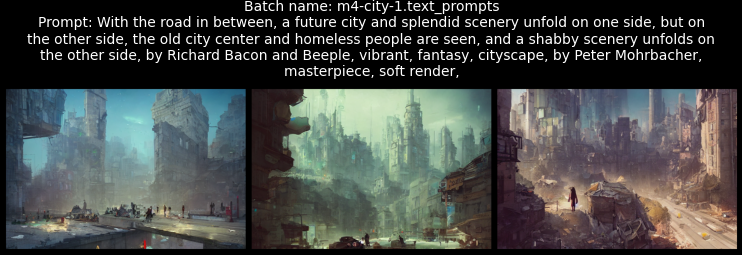

Prompt[6]: With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds on the other side, concept art, and illustration, digital painting, highly detailed, moody palette, by Tyler Edlin and Ross Tran, oil


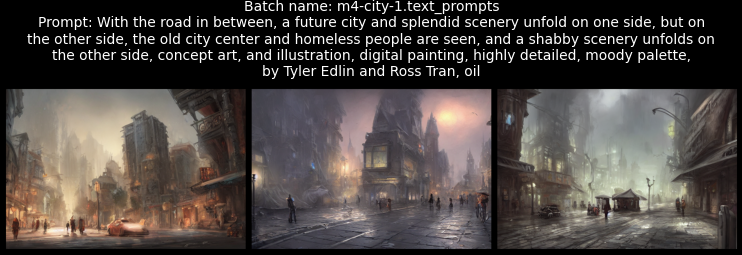

Prompt[7]: With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds on the other side, digital art, aesthetic, moody palette, vaporwave, illustration, graphic novel style, painting, dark, moody palette,


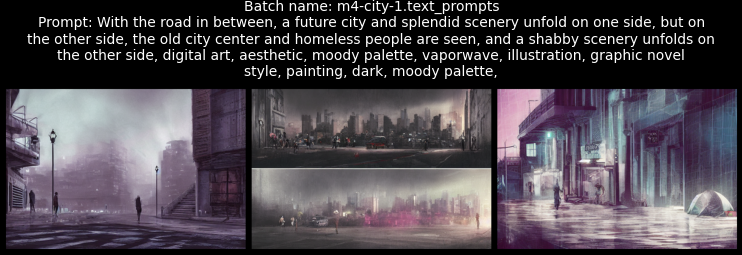

Prompt[8]: With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds on the other side, rembrandt style, artstation, dark, contrasting, contrasting, contrasting, contrasting, contrasting, contrasting, contrasting, contrasting,


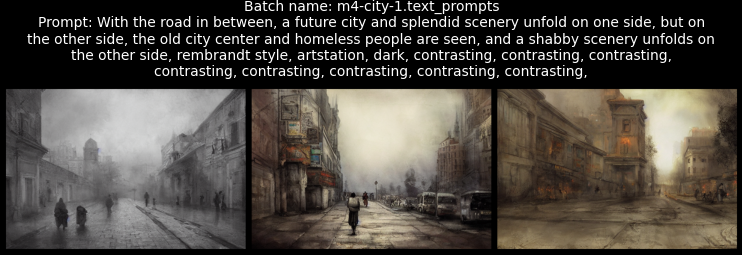

Prompt[9]: With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds on the other side, abandoned buildings, cityscape painting, by Jordan Grimmer and RHADS and Gilbert Williams, artstation, vibrant, oil on canvas


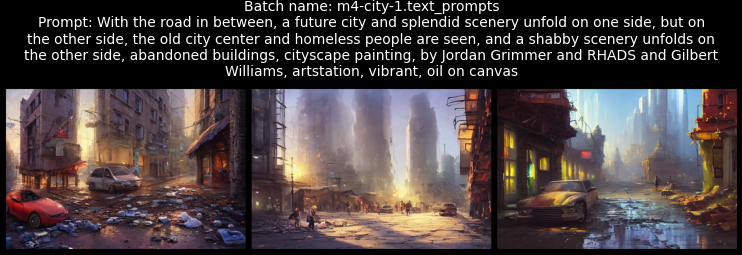

['With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds, digital painting, trending on artstation, moody palette, high contrast, contrasting, contrasting, contrasting, contrasting, contrasting, contrasting, contrasting, contrasting',
 'With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds in the afternoon, moody palette, artstation, character concept, oil on canvas, concept design, vibrant, hdr, 4 k, trending on',
 'With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds, by Caspar David Friedrich, dystopian novelists, oil on canvas, artstation, digital painting, dramatic scenery, cinematic lighting, contest

time: 2min 56s (started: 2022-12-06 05:32:27 +00:00)


In [8]:
prompts = pgen.generate_prompts(
#     batch_name = "m1-cave-1",
#     prompt="Beautiful lake inside the cave with fog and mist, along with bats on the stalactite",
#     batch_name = "m1-cave-2",
#     prompt="Collapsing caves and falling rocks one after another",
#     batch_name = "m2-nature-1",
#     prompt="The blue sea meets the blue sky, the forest where you can feel the powerful vitality, and the high-tech city in the distance. A wild beast suddenly appears and chases after",
#     batch_name = "m3-dancing-1",
#     prompt="Dancing hall, a unique space with futuristic sensibility added to the classic interior",
#     batch_name = "m4-city-1",
#     prompt="With the road in between, a future city and splendid scenery unfold on one side, but on the other side, the old city center and homeless people are seen, and a shabby scenery unfolds",
#     batch_name = "m5-universe-1",
#     prompt="A large asteroid flies in from the front and collides with",
    batch_name = "m6-deepsea-1",
    prompt="A giant octopus in the sea of another planet in space grabs and destroys the environment around it",
#     batch_name = "m7-snake-1",
#     prompt="Colorful snakes cover the walls of the cave.",
    num_prompts_to_generate=10,
    generate_images=True,
    num_samples=3,
    max_prompt_length=70,
    top_p=0.9,
    temperature=0.95,
)
prompts

### Generating images for prompts

Prompt[0]: people looking out a window at night in ancient ruins, in a highly detailed epic CG render, dramatic light, epic shadows, dramatic lightinga 3D portrait of a dragon from a fantasy fantasy medium portrait in a beautiful fantasy, elegant, high detail,


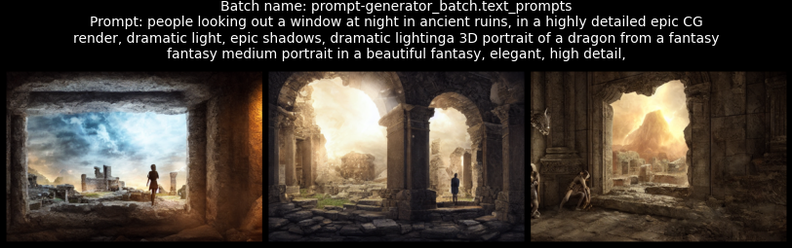

Prompt[1]: people looking out a window, d & d, fantasy, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth, sharp focus, illustration, art by artgerm and greg rutkowski and alphonse


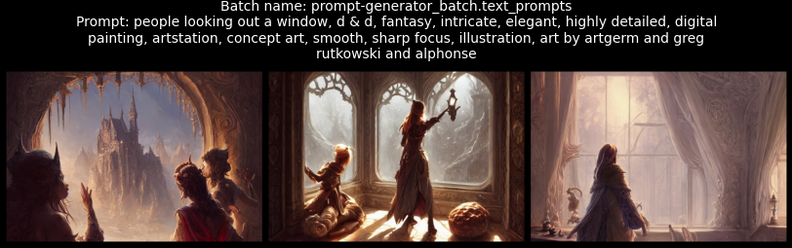

Prompt[2]: people looking out a window at night, in the style of Daniel Craig and Steve Austin. trending on artstationin a desert, d & d, fantasy, intricate, elegant, highly detailed, digital painting, artstation, concept art, smooth,


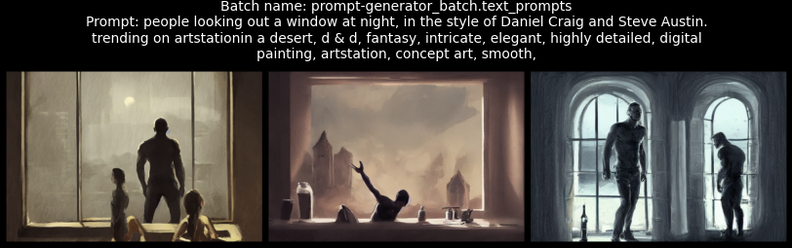

Prompt[3]: people looking out a window at a beautiful view over the bridge on theland, the riverbeds of mountains, beautiful dramatic lighting, beautiful landscape, perfect face, intricate details, artstationhd, cgsocietya photo of an orange


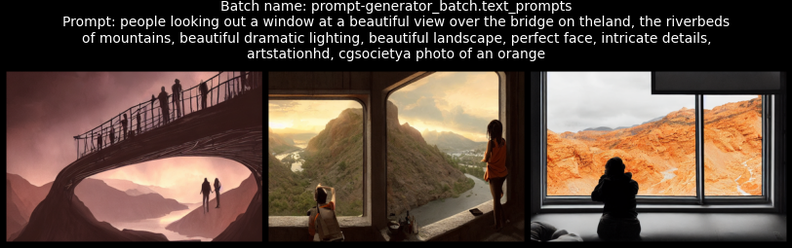

Prompt[4]: people looking out a window. The eyes, fine details, elegant, by greg rutkowski and alphonse muchacloseup shot of a cyberpunk robot in front of a dark dark cave, full of colors, vibrant, intricate,


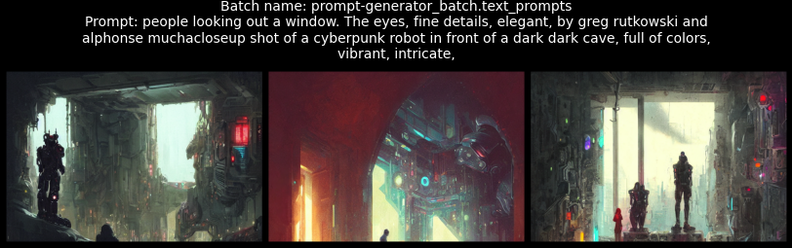

time: 1min 28s (started: 2022-12-02 21:12:49 +00:00)


In [6]:
results = pgen.generate_images(
    prompts=prompts,
    num_samples=3,
    num_inference_steps=50,
)

### Generating images for one prompt

Prompt: people looking out a window at night in ancient ruins, in a highly detailed epic CG render, dramatic light, epic shadows, dramatic lightinga 3D portrait of a dragon from a fantasy fantasy medium portrait in a beautiful fantasy, elegant, high detail,


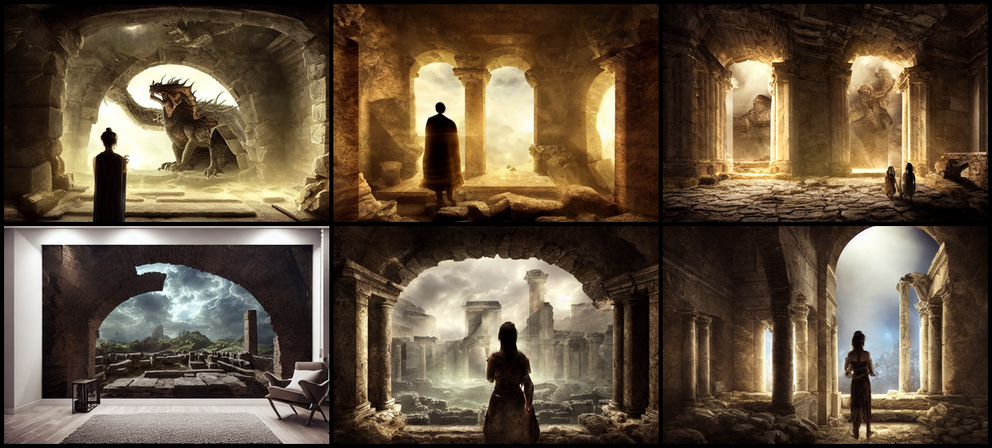

time: 33.5 s (started: 2022-12-02 21:14:27 +00:00)


In [7]:
results = pgen.imagine(
    text_prompts=prompts[0],
    num_samples=6,
    num_inference_steps=50,
    guidance_scale=10,
)

## Training a Generator

### Preparing a dataset

You can use any dataset you want. However, the dataset should be in the format of [HuggingFace Datasets](https://huggingface.co/docs/datasets/).

#### Using a dataset from HuggingFace Hub

To track runs with wandb, you may need to provide a Weights & Biases API Key. You can get one from [here](https://wandb.ai/settings).

```python
# Set WANDB API KEY
eKonf.os.secrets.WANDB_API_KEY = "YOUR_KEY"
```

In [5]:
# Set WANDB API KEY
# eKonf.os.secrets.WANDB_API_KEY = "YOUR_KEY"

print(eKonf.os.secrets.WANDB_API_KEY)

**********
time: 713 µs (started: 2022-12-05 09:42:19 +00:00)


In [7]:
pgen.dataset.validation_split_percentage = 5
pgen.load_datasets("Gustavosta/Stable-Diffusion-Prompts")
pgen.raw_datasets

  0%|          | 0/2 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['Prompt'],
        num_rows: 70032
    })
    test: Dataset({
        features: ['Prompt'],
        num_rows: 8192
    })
    validation: Dataset({
        features: ['Prompt'],
        num_rows: 3686
    })
})

time: 14.9 s (started: 2022-12-05 09:51:06 +00:00)


In [8]:
model_name = "ekorpkit/stable-prompts"

pgen.dataset.line_by_line = False
pgen.training.num_train_epochs = 1
pgen.training.logging_steps = 100
pgen.model.model_name = model_name
# pgen.model.ignore_model_path = True

pgen.train()

Running tokenizer on every text in dataset:   0%|          | 0/71 [00:00<?, ?ba/s]

Running tokenizer on every text in dataset:   0%|          | 0/9 [00:00<?, ?ba/s]

Running tokenizer on every text in dataset:   0%|          | 0/4 [00:00<?, ?ba/s]

Grouping texts in chunks of 1024:   0%|          | 0/71 [00:00<?, ?ba/s]

Grouping texts in chunks of 1024:   0%|          | 0/9 [00:00<?, ?ba/s]

Grouping texts in chunks of 1024:   0%|          | 0/4 [00:00<?, ?ba/s]

[INFO|trainer.py:557] 2022-12-05 09:51:43,963 >> Using cuda_amp half precision backend
[INFO|trainer.py:725] 2022-12-05 09:51:44,229 >> The following columns in the training set don't have a corresponding argument in `GPT2LMHeadModel.forward` and have been ignored: special_tokens_mask. If special_tokens_mask are not expected by `GPT2LMHeadModel.forward`,  you can safely ignore this message.
[INFO|trainer.py:1608] 2022-12-05 09:51:44,235 >> ***** Running training *****
[INFO|trainer.py:1609] 2022-12-05 09:51:44,235 >>   Num examples = 4242
[INFO|trainer.py:1610] 2022-12-05 09:51:44,235 >>   Num Epochs = 1
[INFO|trainer.py:1611] 2022-12-05 09:51:44,236 >>   Instantaneous batch size per device = 1
[INFO|trainer.py:1612] 2022-12-05 09:51:44,236 >>   Total train batch size (w. parallel, distributed & accumulation) = 16
[INFO|trainer.py:1613] 2022-12-05 09:51:44,236 >>   Gradient Accumulation steps = 8
[INFO|trainer.py:1614] 2022-12-05 09:51:44,236 >>   Total optimization steps = 265
[INFO|t

[WARNING|logging.py:275] 2022-12-05 09:51:51,972 >> You're using a GPT2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Step,Training Loss,Validation Loss


[INFO|trainer.py:1859] 2022-12-05 09:53:22,823 >> 

Training completed. Do not forget to share your model on huggingface.co/models =)


[INFO|trainer.py:2678] 2022-12-05 09:53:22,826 >> Saving model checkpoint to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts
[INFO|configuration_utils.py:447] 2022-12-05 09:53:22,827 >> Configuration saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts/config.json
[INFO|modeling_utils.py:1624] 2022-12-05 09:53:23,293 >> Model weights saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts/pytorch_model.bin
[INFO|tokenization_utils_base.py:2125] 2022-12-05 09:53:23,295 >> tokenizer config file saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/stable-prompts/tokenizer_config.json
[INFO|tokenization_utils_base.py:2132] 2022-12-05 09:53:23,296 >> Special tokens file saved in /conten

***** train metrics *****
  epoch                    =        1.0
  total_flos               =  1031810GF
  train_loss               =     2.1092
  train_runtime            = 0:01:38.58
  train_samples            =       4242
  train_samples_per_second =     43.028
  train_steps_per_second   =      2.688


***** eval metrics *****
  epoch                   =        1.0
  eval_loss               =     1.9703
  eval_runtime            = 0:00:02.05
  eval_samples            =        222
  eval_samples_per_second =     107.82
  eval_steps_per_second   =      53.91
  perplexity              =     7.1727


[INFO|modelcard.py:449] 2022-12-05 09:53:26,384 >> Dropping the following result as it does not have all the necessary fields:
{'task': {'name': 'Causal Language Modeling', 'type': 'text-generation'}, 'dataset': {'name': 'Gustavosta/Stable-Diffusion-Prompts', 'type': 'Gustavosta/Stable-Diffusion-Prompts'}}


time: 2min 6s (started: 2022-12-05 09:51:21 +00:00)


Prompt[0]: people looking out a lonely city street in the distance. By Jim Geracheal, in the style of Francis Bacon and Syd Mead and Edward Hopper, open ceiling, highly detailed, painted by Francis Bacon, painted by James Gilleard, surreal


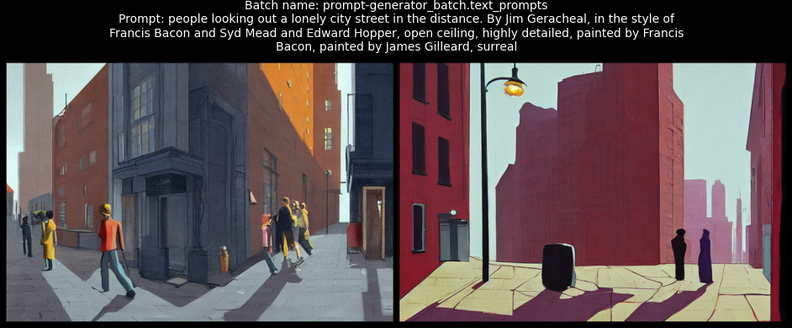

Prompt[1]: people looking out a lonely city street with glowing pink sky, at night in a dark and grim atmosphere, highly detailed painting by craig mullins and greg rutkowski, trending on artstationA beautiful epic fantasy world that is shrouded in mystery


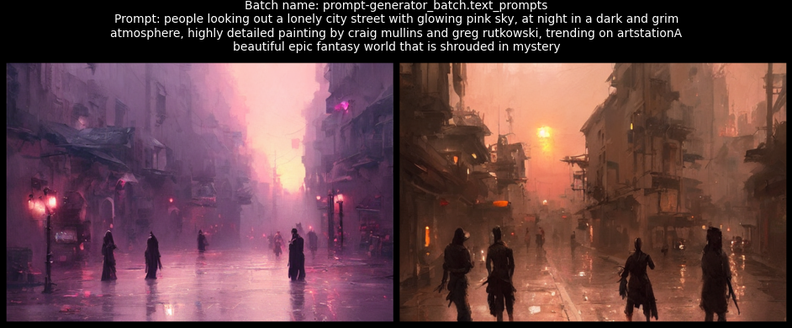

time: 53.2 s (started: 2022-12-05 09:53:27 +00:00)


In [9]:
pgen.load_model(model_name=model_name)
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=2,
    generate_images=True,
    num_samples=2,
)

#### Using a dataset from a text file

In [10]:
prompt_uri = "https://raw.githubusercontent.com/entelecheia/ekorpkit-book/main/assets/data/prompt_parrot.txt"
pgen.load_datasets(train_file=prompt_uri)
pgen.raw_datasets

DatasetDict({
    validation: Dataset({
        features: ['text'],
        num_rows: 9
    })
    train: Dataset({
        features: ['text'],
        num_rows: 176
    })
})

time: 2.24 s (started: 2022-12-05 09:54:23 +00:00)


In [11]:
model_name="ekorpkit/prompt_parrot"

pgen.dataset.line_by_line = True
pgen.training.num_train_epochs = 10
pgen.training.logging_steps = 100
pgen.model.model_name = model_name

pgen.train()

[INFO|training_args.py:1324] 2022-12-05 09:54:27,244 >> PyTorch: setting up devices


Running tokenizer on dataset line_by_line:   0%|          | 0/1 [00:00<?, ?ba/s]

Running tokenizer on dataset line_by_line:   0%|          | 0/1 [00:00<?, ?ba/s]

[INFO|trainer.py:557] 2022-12-05 09:54:29,187 >> Using cuda_amp half precision backend
[INFO|trainer.py:725] 2022-12-05 09:54:29,674 >> The following columns in the training set don't have a corresponding argument in `GPT2LMHeadModel.forward` and have been ignored: special_tokens_mask. If special_tokens_mask are not expected by `GPT2LMHeadModel.forward`,  you can safely ignore this message.
[INFO|trainer.py:1608] 2022-12-05 09:54:29,680 >> ***** Running training *****
[INFO|trainer.py:1609] 2022-12-05 09:54:29,680 >>   Num examples = 176
[INFO|trainer.py:1610] 2022-12-05 09:54:29,681 >>   Num Epochs = 10
[INFO|trainer.py:1611] 2022-12-05 09:54:29,681 >>   Instantaneous batch size per device = 1
[INFO|trainer.py:1612] 2022-12-05 09:54:29,681 >>   Total train batch size (w. parallel, distributed & accumulation) = 16
[INFO|trainer.py:1613] 2022-12-05 09:54:29,682 >>   Gradient Accumulation steps = 8
[INFO|trainer.py:1614] 2022-12-05 09:54:29,682 >>   Total optimization steps = 110
[INFO|t

Step,Training Loss,Validation Loss


[INFO|trainer.py:1859] 2022-12-05 09:55:05,131 >> 

Training completed. Do not forget to share your model on huggingface.co/models =)


[INFO|trainer.py:2678] 2022-12-05 09:55:05,133 >> Saving model checkpoint to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/prompt_parrot
[INFO|configuration_utils.py:447] 2022-12-05 09:55:05,135 >> Configuration saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/prompt_parrot/config.json
[INFO|modeling_utils.py:1624] 2022-12-05 09:55:05,583 >> Model weights saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/prompt_parrot/pytorch_model.bin
[INFO|tokenization_utils_base.py:2125] 2022-12-05 09:55:05,584 >> tokenizer config file saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/ekorpkit/prompt_parrot/tokenizer_config.json
[INFO|tokenization_utils_base.py:2132] 2022-12-05 09:55:05,585 >> Special tokens file saved in /content/dr

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   428298GF
  train_loss               =     3.1856
  train_runtime            = 0:00:35.44
  train_samples            =        176
  train_samples_per_second =      49.65
  train_steps_per_second   =      3.103


***** eval metrics *****
  epoch                   =       10.0
  eval_loss               =     3.4783
  eval_runtime            = 0:00:00.08
  eval_samples            =          9
  eval_samples_per_second =    101.189
  eval_steps_per_second   =     56.216
  perplexity              =    32.4039


[INFO|modelcard.py:449] 2022-12-05 09:55:06,649 >> Dropping the following result as it does not have all the necessary fields:
{'task': {'name': 'Causal Language Modeling', 'type': 'text-generation'}}


time: 40.9 s (started: 2022-12-05 09:54:26 +00:00)


Prompt[0]: people looking out a lonely city street, artstation, foggy, by John Atkinson Grimshaw and RHADS and Gilbert Williams and Marina Federovna, digital art, dramatic scenery, synthwave, digital painting, award winninga magical realism painting by


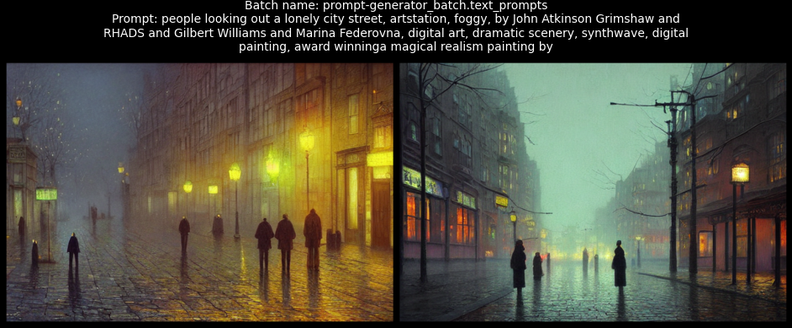

Prompt[1]: people looking out a lonely city street in a neon-light nightscape by the beach, foggy, vaporwave art, surrealism, by Tyler Edlin and Gaston Bussiere, oil on canvas, moody palette, german romantic


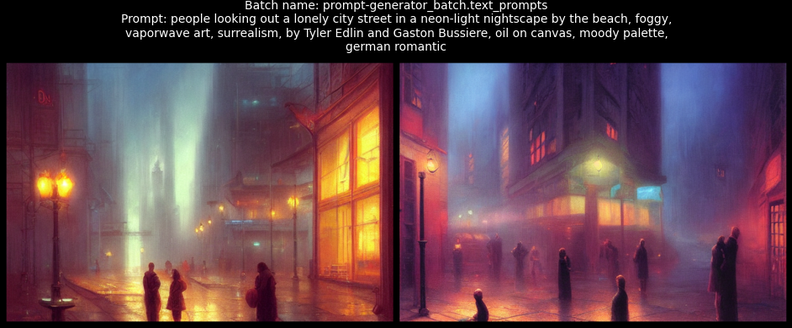

time: 28.3 s (started: 2022-12-05 09:55:32 +00:00)


In [12]:
pgen.load_model(model_name=model_name)
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=2,
    generate_images=True,
    num_samples=2,
)

## References

- [Gustavosta/Stable-Diffusion-Prompts](https://huggingface.co/datasets/Gustavosta/Stable-Diffusion-Prompts)